In [1]:
# %pip install wandb

In [18]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

from torch.utils.data import DataLoader
from torchvision import transforms

# Датасет, гиперпараметры, модели

In [2]:
from dataset import ArchDataset, GS_NEGATIVE_PATHS, GS_POSITIVE_PATHS, GS_NEGATIVE_COORDS, GS_POSITIVE_COORDS
from train_wgan_spectral import train_wgan_spectral
from model_4_panda_256 import PandaGenerator, PandaDiscriminator, PandaEncoder

In [3]:
generator_path = f'results_bilinear256_v_1/generator_199.pth'
discriminator_path = f'results_bilinear256_v_1/discriminator_199.pth'
encoder_path = f'results_bilinear256_encoder_v_1/encoder_199.pth'

In [4]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
device

device(type='cpu')

In [5]:
params = {
    'batch_size': 1,
    'channels': 3,
    'img_size': 256,
    'latent_dim': 512,
    'lr': 0.0002,
    'b1': 0.5,
    'b2': 0.999,
    'n_epochs': 200,
    'n_critic': 5,
    'sample_interval': 400,
}

In [6]:
transform_crop_64 = transforms.Compose([
    # transforms.CenterCrop((64, 64)),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

In [7]:
train_dataset = ArchDataset(
    img_paths=GS_NEGATIVE_PATHS, 
    coords=GS_NEGATIVE_COORDS, 
    anomalies=False, 
    transform=transform_crop_64
)
train_loader = DataLoader(train_dataset, batch_size=params['batch_size'], shuffle=True)

anomalies_dataset = ArchDataset(
    img_paths=GS_POSITIVE_PATHS, 
    coords=GS_POSITIVE_COORDS, 
    anomalies=False, 
    transform=transform_crop_64
)
anomalies_loader = DataLoader(anomalies_dataset, batch_size=params['batch_size'], shuffle=False)

In [8]:
print(f'train: {len(train_dataset)} images, {len(train_loader)} batches')
print(f'anomalies: {len(anomalies_dataset)} images, {len(anomalies_loader)} batches')

train: 99254 images, 99254 batches
anomalies: 165 images, 165 batches


In [9]:
generator = PandaGenerator(params)
discriminator = PandaDiscriminator(params)
encoder = PandaEncoder(params)

In [10]:
# map_location=torch.device('cpu')

generator.load_state_dict(torch.load(generator_path, map_location=torch.device('cpu')))
discriminator.load_state_dict(torch.load(discriminator_path, map_location=torch.device('cpu')))
encoder.load_state_dict(torch.load(encoder_path, map_location=torch.device('cpu')))

<All keys matched successfully>

In [11]:
generator.to(device).eval();
discriminator.to(device).eval();
encoder.to(device).eval();

# Модель сравнения изображений

In [15]:
criterion = nn.MSELoss()
kappa=1.0

# with open("score.csv", "w") as f:
#     f.write("label,img_distance,anomaly_score,z_distance\n")

In [19]:
def test(img):
    
    real_img = img.to(device)
    real_z = encoder(real_img)
    fake_img = generator(real_z)
    fake_z = encoder(fake_img)

    real_feature = discriminator.forward_features(real_img)
    fake_feature = discriminator.forward_features(fake_img)

    img_distance = criterion(fake_img, real_img)
    loss_feature = criterion(fake_feature, real_feature)
    anomaly_score = img_distance + kappa * loss_feature

    z_distance = criterion(fake_z, real_z)
    
    return fake_img, img_distance.item(), anomaly_score.item(), z_distance.item()
    
    # with open("results/score.csv", "a") as f:
    #     f.write(f"{label.item()},{img_distance},"
    #             f"{anomaly_score},{z_distance}\n")
    

# Смотрим, как восстанавливаются картинки

## Train dataset

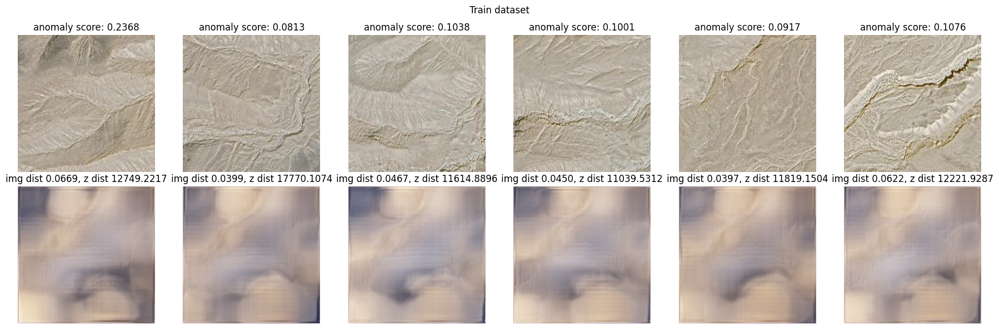

In [20]:
nrows, ncols = 2, 6

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize = (3 * ncols, 3 * nrows))

fig.suptitle('Train dataset')

for j in range(ncols):
    
    for i in range(nrows):
        axs[i, j].axis('off')
        axs[i, j].grid('off')
        
    img, label, coord, _ = train_dataset[j]
    img = img[None, :, :, :]
    fake_img, img_distance, anomaly_score, z_distance = test(img)

    axs[0, j].imshow((img[0].cpu().permute(1, 2, 0).detach().numpy() + 1) / 2)
    axs[1, j].imshow((fake_img[0].cpu().permute(1, 2, 0).detach().numpy() + 1) / 2)
    
    axs[0, j].title.set_text(f'anomaly score: {anomaly_score:.4f}')
    axs[1, j].title.set_text(f'img dist {img_distance:.4f}, z dist {z_distance:.4f}')
    
fig.tight_layout()
fig.show()

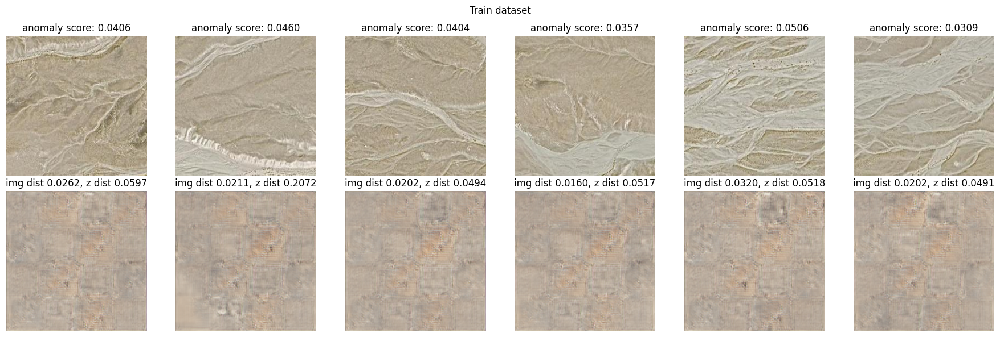

In [17]:
nrows, ncols = 2, 6

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize = (3 * ncols, 3 * nrows))

fig.suptitle('Train dataset')

for j in range(ncols):
    
    for i in range(nrows):
        axs[i, j].axis('off')
        axs[i, j].grid('off')
        
    img, label, coord, _ = train_dataset[j + 6]
    img = img[None, :, :, :]
    fake_img, img_distance, anomaly_score, z_distance = test(img)

    axs[0, j].imshow((img[0].cpu().permute(1, 2, 0).detach().numpy() + 1) / 2)
    axs[1, j].imshow((fake_img[0].cpu().permute(1, 2, 0).detach().numpy() + 1) / 2)
    
    axs[0, j].title.set_text(f'anomaly score: {anomaly_score:.4f}')
    axs[1, j].title.set_text(f'img dist {img_distance:.4f}, z dist {z_distance:.4f}')
    
fig.tight_layout()
fig.show()

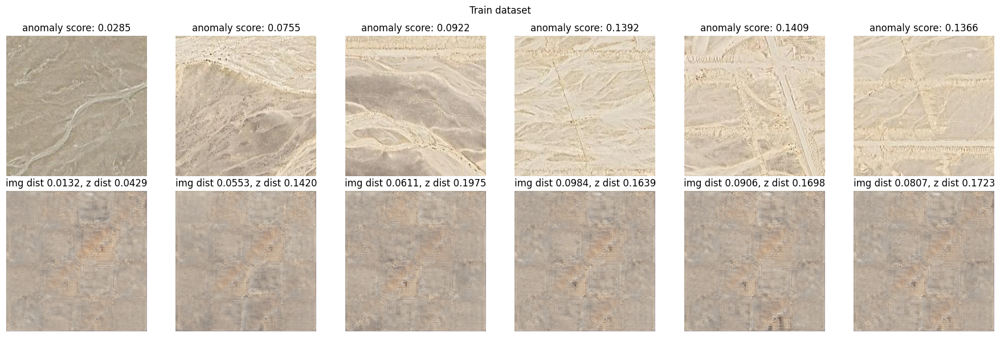

In [18]:
nrows, ncols = 2, 6

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize = (3 * ncols, 3 * nrows))

fig.suptitle('Train dataset')

for j in range(ncols):
    
    for i in range(nrows):
        axs[i, j].axis('off')
        axs[i, j].grid('off')
        
    img, label, coord, _ = train_dataset[j + 12]
    img = img[None, :, :, :]
    fake_img, img_distance, anomaly_score, z_distance = test(img)

    axs[0, j].imshow((img[0].cpu().permute(1, 2, 0).detach().numpy() + 1) / 2)
    axs[1, j].imshow((fake_img[0].cpu().permute(1, 2, 0).detach().numpy() + 1) / 2)
    
    axs[0, j].title.set_text(f'anomaly score: {anomaly_score:.4f}')
    axs[1, j].title.set_text(f'img dist {img_distance:.4f}, z dist {z_distance:.4f}')
    
fig.tight_layout()
fig.show()

## Anomalies dataset

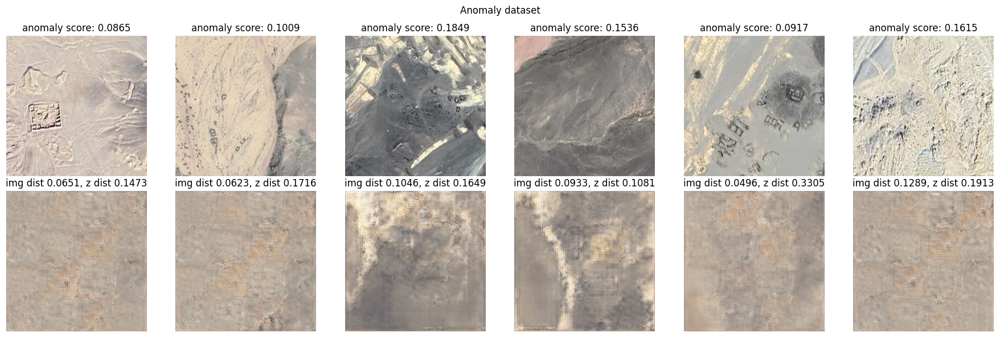

In [19]:
nrows, ncols = 2, 6

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize = (3 * ncols, 3 * nrows))

fig.suptitle('Anomaly dataset')

for j in range(ncols):
    
    for i in range(nrows):
        axs[i, j].axis('off')
        axs[i, j].grid('off')
        
    img, label, coord, _ = anomalies_dataset[j]
    img = img[None, :, :, :]
    fake_img, img_distance, anomaly_score, z_distance = test(img)

    axs[0, j].imshow((img[0].cpu().permute(1, 2, 0).detach().numpy() + 1) / 2)
    axs[1, j].imshow((fake_img[0].cpu().permute(1, 2, 0).detach().numpy() + 1) / 2)
    
    axs[0, j].title.set_text(f'anomaly score: {anomaly_score:.4f}')
    axs[1, j].title.set_text(f'img dist {img_distance:.4f}, z dist {z_distance:.4f}')
    
fig.tight_layout()
fig.show()

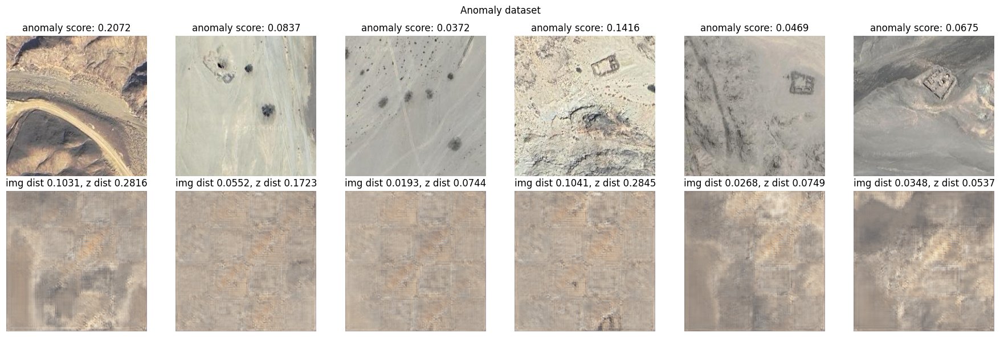

In [20]:
nrows, ncols = 2, 6

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize = (3 * ncols, 3 * nrows))

fig.suptitle('Anomaly dataset')

for j in range(ncols):
    
    for i in range(nrows):
        axs[i, j].axis('off')
        axs[i, j].grid('off')
        
    img, label, coord, _ = anomalies_dataset[j + 6]
    img = img[None, :, :, :]
    fake_img, img_distance, anomaly_score, z_distance = test(img)

    axs[0, j].imshow((img[0].cpu().permute(1, 2, 0).detach().numpy() + 1) / 2)
    axs[1, j].imshow((fake_img[0].cpu().permute(1, 2, 0).detach().numpy() + 1) / 2)
    
    axs[0, j].title.set_text(f'anomaly score: {anomaly_score:.4f}')
    axs[1, j].title.set_text(f'img dist {img_distance:.4f}, z dist {z_distance:.4f}')
    
fig.tight_layout()
fig.show()

# Самые аномальные картинки

## Anomalies dataset

In [21]:
anomaly_scores = {}

for i in tqdm(range(len(anomalies_dataset))):
    img, label, coord, _ = anomalies_dataset[i]
    img = img[None, :, :, :]
    fake_img, img_distance, anomaly_score, z_distance = test(img)
    anomaly_scores[i] = anomaly_score
    
anomaly_scores_sorted = sorted([(score, i) for (i, score) in anomaly_scores.items()])

100%|██████████| 165/165 [00:03<00:00, 43.48it/s]


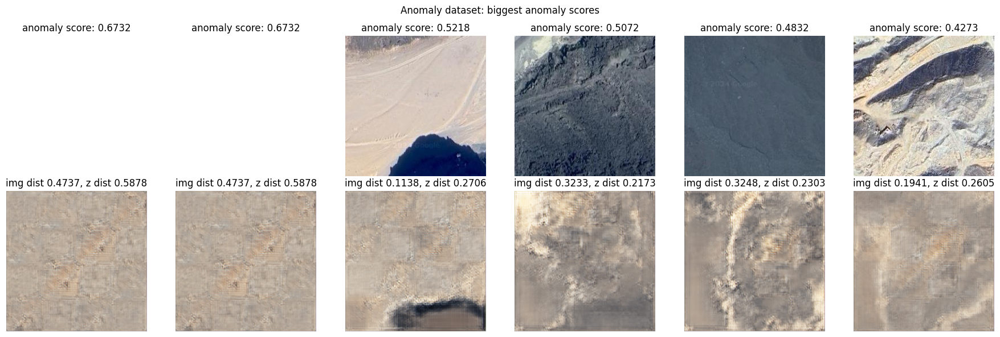

In [22]:
nrows, ncols = 2, 6

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize = (3 * ncols, 3 * nrows))

fig.suptitle('Anomaly dataset: biggest anomaly scores')

for j in range(ncols):
    
    ind_in_dataset = anomaly_scores_sorted[len(anomaly_scores_sorted) - 1 - j][1]
    
    for i in range(nrows):
        axs[i, j].axis('off')
        axs[i, j].grid('off')
        
    img, label, coord, _ = anomalies_dataset[ind_in_dataset]
    img = img[None, :, :, :]
    fake_img, img_distance, anomaly_score, z_distance = test(img)

    axs[0, j].imshow((img[0].permute(1, 2, 0).detach().numpy() + 1) / 2)
    axs[1, j].imshow((fake_img.cpu()[0].permute(1, 2, 0).detach().numpy() + 1) / 2)
    
    axs[0, j].title.set_text(f'anomaly score: {anomaly_score:.4f}')
    axs[1, j].title.set_text(f'img dist {img_distance:.4f}, z dist {z_distance:.4f}')
    
fig.tight_layout()
fig.show()

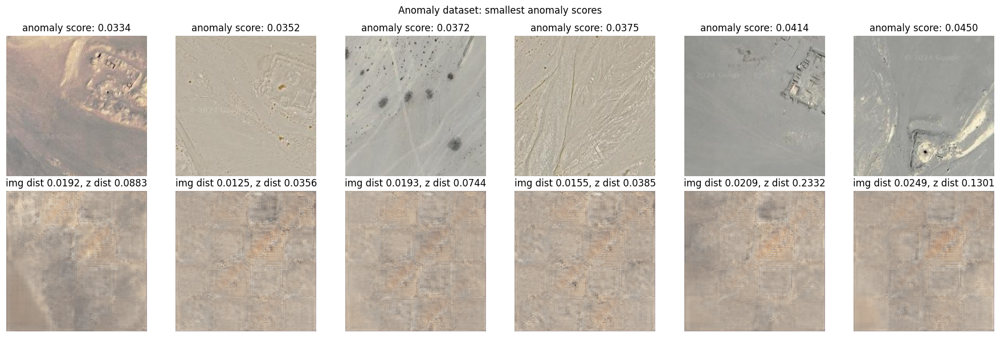

In [23]:
nrows, ncols = 2, 6

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize = (3 * ncols, 3 * nrows))

fig.suptitle('Anomaly dataset: smallest anomaly scores')

for j in range(ncols):
    
    ind_in_dataset = anomaly_scores_sorted[j][1]
    
    for i in range(nrows):
        axs[i, j].axis('off')
        axs[i, j].grid('off')
        
    img, label, coord, _ = anomalies_dataset[ind_in_dataset]
    img = img[None, :, :, :]
    fake_img, img_distance, anomaly_score, z_distance = test(img)

    axs[0, j].imshow((img[0].permute(1, 2, 0).detach().numpy() + 1) / 2)
    axs[1, j].imshow((fake_img.cpu()[0].permute(1, 2, 0).detach().numpy() + 1) / 2)
    
    axs[0, j].title.set_text(f'anomaly score: {anomaly_score:.4f}')
    axs[1, j].title.set_text(f'img dist {img_distance:.4f}, z dist {z_distance:.4f}')
    
fig.tight_layout()
fig.show()

fig.savefig('least_suspicious')

## Train dataset

In [97]:
anomaly_scores_train = {}

for i in tqdm(range(len(train_dataset))):
    img, label, coord, _ = train_dataset[i]
    img = img[None, :, :, :]
    fake_img, img_distance, anomaly_score, z_distance = test(img)
    anomaly_scores_train[i] = anomaly_score

 51%|█████     | 50490/99254 [17:24<16:48, 48.33it/s]


KeyboardInterrupt: 

In [98]:
anomaly_scores_train_sorted = sorted([(score, i) for (i, score) in anomaly_scores_train.items()])

In [99]:
anomaly_scores_lst = [score for (score, i) in anomaly_scores_sorted]
anomaly_scores_train_lst = [score for (score, i) in anomaly_scores_train_sorted]

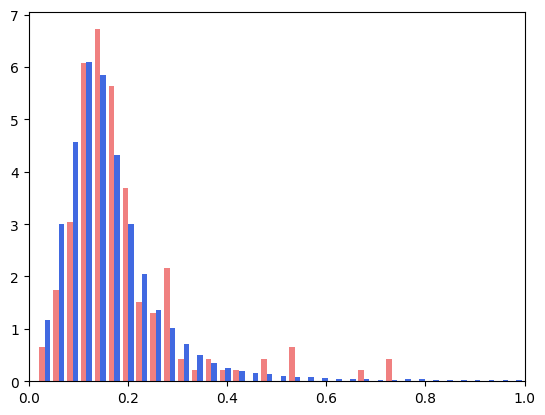

In [102]:
plt.hist([anomaly_scores_lst, anomaly_scores_train_lst], bins=400, color=['lightcoral', 'royalblue'], density=True);
plt.xlim([0, 1]);
# plt.hist(anomaly_scores_train_lst, bins=100, color='royalblue');
plt.savefig('hist');

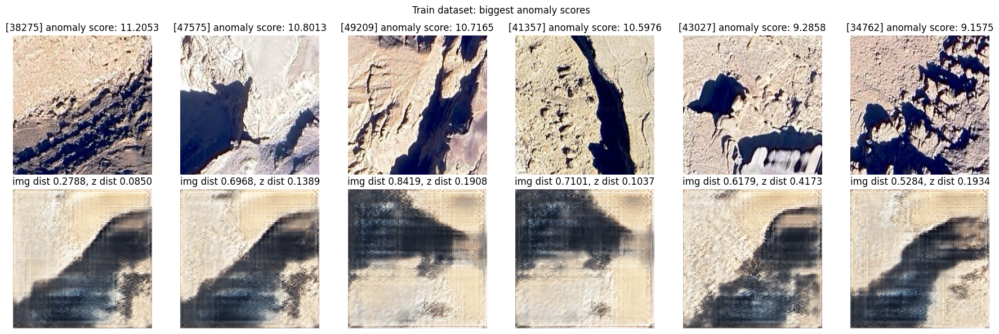

In [104]:
nrows, ncols = 2, 6

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize = (3 * ncols, 3 * nrows))

fig.suptitle('Train dataset: biggest anomaly scores')

for j in range(ncols):
    
    ind_in_dataset = anomaly_scores_train_sorted[len(anomaly_scores_train_sorted) - 1 - j][1]
    
    for i in range(nrows):
        axs[i, j].axis('off')
        axs[i, j].grid('off')
        
    img, label, coord, _ = train_dataset[ind_in_dataset]
    img = img[None, :, :, :]
    fake_img, img_distance, anomaly_score, z_distance = test(img)

    axs[0, j].imshow((img[0].permute(1, 2, 0).detach().numpy() + 1) / 2)
    axs[1, j].imshow((fake_img.cpu()[0].permute(1, 2, 0).detach().numpy() + 1) / 2)
    
    axs[0, j].title.set_text(f'[{ind_in_dataset}] anomaly score: {anomaly_score:.4f}')
    axs[1, j].title.set_text(f'img dist {img_distance:.4f}, z dist {z_distance:.4f}')
    
fig.tight_layout()
fig.show()

In [ ]:
nrows, ncols = 2, 200

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize = (3 * ncols, 3 * nrows))

fig.suptitle('Train dataset: biggest anomaly scores')

for j in range(ncols):
    
    ind_in_dataset = anomaly_scores_train_sorted[len(anomaly_scores_train_sorted) - 1 - j][1]
    
    for i in range(nrows):
        axs[i, j].axis('off')
        axs[i, j].grid('off')
        
    img, label, coord, _ = train_dataset[ind_in_dataset]
    img = img[None, :, :, :]
    fake_img, img_distance, anomaly_score, z_distance = test(img)

    axs[0, j].imshow((img[0].permute(1, 2, 0).detach().numpy() + 1) / 2)
    axs[1, j].imshow((fake_img.cpu()[0].permute(1, 2, 0).detach().numpy() + 1) / 2)
    
    axs[0, j].title.set_text(f'[{ind_in_dataset}] anomaly score: {anomaly_score:.4f}')
    axs[1, j].title.set_text(f'img dist {img_distance:.4f}, z dist {z_distance:.4f}')
    
fig.tight_layout()
fig.show()

In [ ]:
nrows, ncols = 2, 6

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize = (3 * ncols, 3 * nrows))

fig.suptitle('Train dataset: smallest anomaly scores')

for j in range(ncols):
    
    ind_in_dataset = anomaly_scores_train_sorted[j][1]
    
    for i in range(nrows):
        axs[i, j].axis('off')
        axs[i, j].grid('off')
        
    img, label, coord, _ = train_dataset[ind_in_dataset]
    img = img[None, :, :, :]
    fake_img, img_distance, anomaly_score, z_distance = test(img)

    axs[0, j].imshow((img[0].permute(1, 2, 0).detach().numpy() + 1) / 2)
    axs[1, j].imshow((fake_img[0].permute(1, 2, 0).detach().numpy() + 1) / 2)
    
    axs[0, j].title.set_text(f'anomaly score: {anomaly_score:.4f}')
    axs[1, j].title.set_text(f'img dist {img_distance:.4f}, z dist {z_distance:.4f}')
    
fig.tight_layout()
fig.show()

In [ ]:
nrows, ncols = 2, 200

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize = (3 * ncols, 3 * nrows))

fig.suptitle('Train dataset: smallest anomaly scores')

for j in range(ncols):
    
    ind_in_dataset = anomaly_scores_train_sorted[j][1]
    
    for i in range(nrows):
        axs[i, j].axis('off')
        axs[i, j].grid('off')
        
    img, label, coord, _ = train_dataset[ind_in_dataset]
    img = img[None, :, :, :]
    fake_img, img_distance, anomaly_score, z_distance = test(img)

    axs[0, j].imshow((img[0].permute(1, 2, 0).detach().numpy() + 1) / 2)
    axs[1, j].imshow((fake_img[0].permute(1, 2, 0).detach().numpy() + 1) / 2)
    
    axs[0, j].title.set_text(f'anomaly score: {anomaly_score:.4f}')
    axs[1, j].title.set_text(f'img dist {img_distance:.4f}, z dist {z_distance:.4f}')
    
fig.tight_layout()
fig.show()